In [8]:
import os
import numpy as np
import numpy.ma as ma
import pandas as pd
import iris
import matplotlib.pyplot as plt
os.environ["PROJ_LIB"] = "C:\\Utilities\\Python\\Anaconda\\Library\\share"; #fixr
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from textwrap import wrap
from src.ploter_functions import pcolormesh_basemapplot
from src.ploter_functions import median_correlation_plot
from src.ploter_functions import correlation_scatter_plot
from src.ploter_functions import difference_to_ensemble_plot
from src.ploter_functions import difference_to_pair_plot
from src.ploter_functions import elevation_difference_to_ensemble_plot
from src.ploter_functions import correlation_bias_elevation_pair_plot
from src.ploter_functions import correlation_table
from src.ploter_functions import rmsd_table
from src.ploter_functions import stl_example_plot

In [9]:
results_figures_path = '/home/users/carter10/Antarctica_Climate_Variability/results/Paper_Figures/'

## Figure A1

In [3]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'

In [4]:
labels_fontsize = 6
marks_fontsize = 4
ylabel_pad = -0.04
title_height = .95
label_height = .92
label_left = .02
year_min = 2000
year_max = 2010
year_tick_freq = 2
linewidth = .8

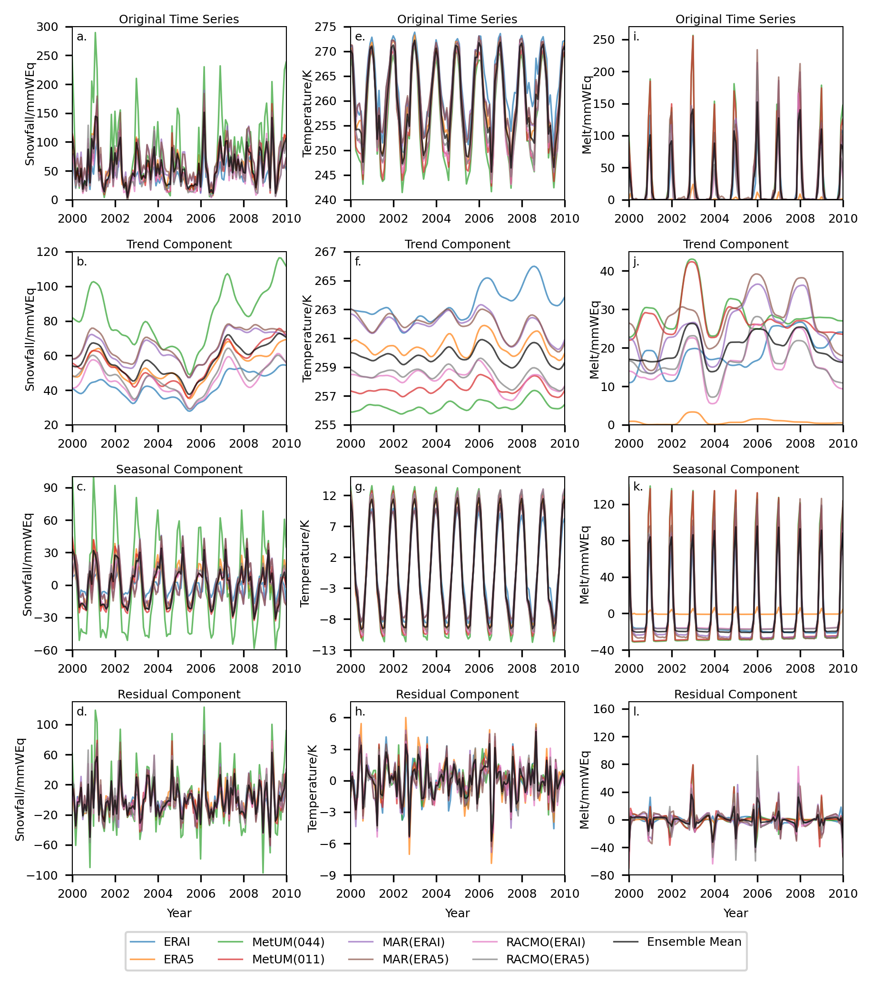

In [7]:
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(figsize=(17.7*cm,20*cm), dpi= 300, facecolor='w', edgecolor='k')
stl_example_plot(input_path,labels_fontsize,ylabel_pad,linewidth,year_min,year_max,year_tick_freq,title_height)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.','k.','l.']
axes = plt.gcf().get_axes()
for axis,label in zip(axes,labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_left,label_height),xycoords='axes fraction',fontsize=6) # Setting labels

ensemble_names = ['ERAI','ERA5','MetUM(044)','MetUM(011)','MAR(ERAI)','MAR(ERA5)','RACMO(ERAI)','RACMO(ERA5)']
fig.legend(ensemble_names+['Ensemble Mean'], loc='lower center',ncol=5,fontsize=labels_fontsize,borderaxespad=2.5)
    
fig.savefig(f'{results_figures_path}Figure_A1.png',dpi=300,bbox_inches='tight')

## Figure C1

In [3]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
grid_cube = iris.load(grid_cube_path)[0][0]

In [4]:
vmin=-100
vmax=100
label_xy = [.01,.02]
title_height = 0.96
row_xy = [-0.05,0.5]
labels = ['a.ERAI','b.ERA5','c.MetUM(044)','d.MetUM(011)','e.MAR','f.RACMO']

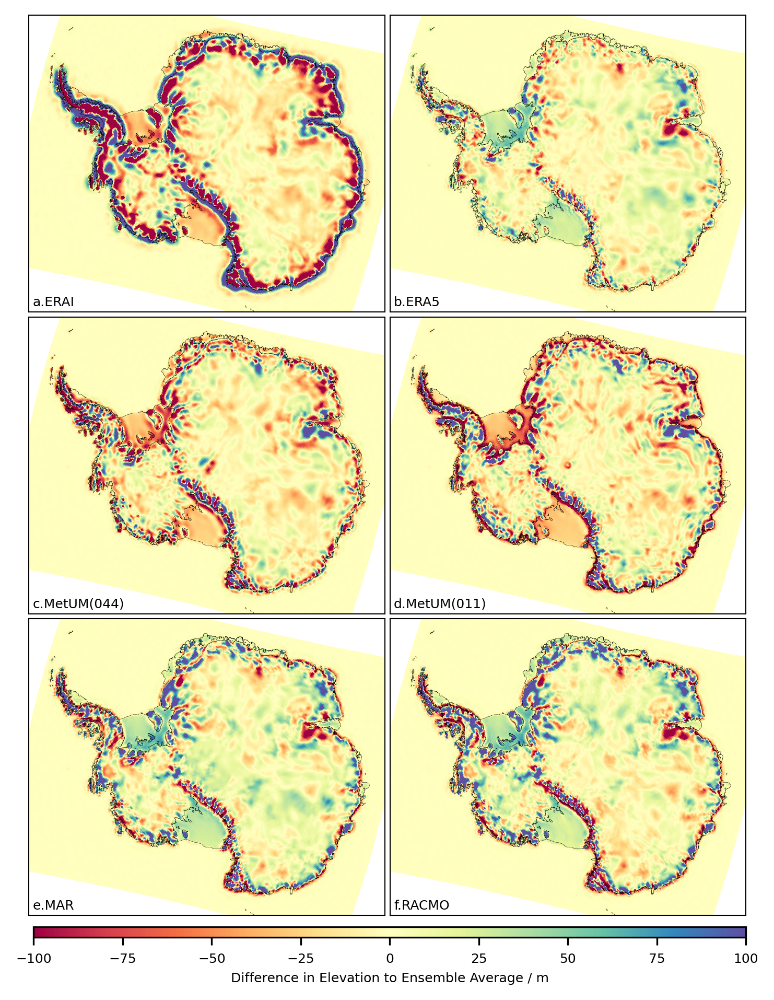

In [5]:
antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(3, 2, sharex='col',dpi= 300, sharey='row',figsize=(15*cm,17.0*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

elevation_difference_to_ensemble_plot(input_path,antarctica_map,vmin,vmax,grid_cube)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Difference in Elevation to Ensemble Average / m', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels

fig.savefig(f'{results_figures_path}Figure_C1.png',dpi=300,bbox_inches='tight')

## Figure C2

In [3]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
variables = ['snowfall','temperature','melt']
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')

In [4]:
label_xy = [.02,.02]
correlation_label_xy = [.62,.93]
labels = ['a.ERAI-ERA5','b.MetUM(044)-MetUM(011)','c.MetUM(011)-MAR(ERA5)','d.MetUM(011)-RACMO(ERA5)']
subplot_dimensions = [2,2] # 2 rows, 2 columns of plots
model_pairs_list = [[0,1],[2,3],[3,5],[3,7]]
plt_number_list = [1,2,3,4]
xlims_list = [[-100,100],[-20,20],[-100,100],[-100,100]]
ylims_list = [[0,2],[-0.5,0.5],[-3,1],[-1,3]]

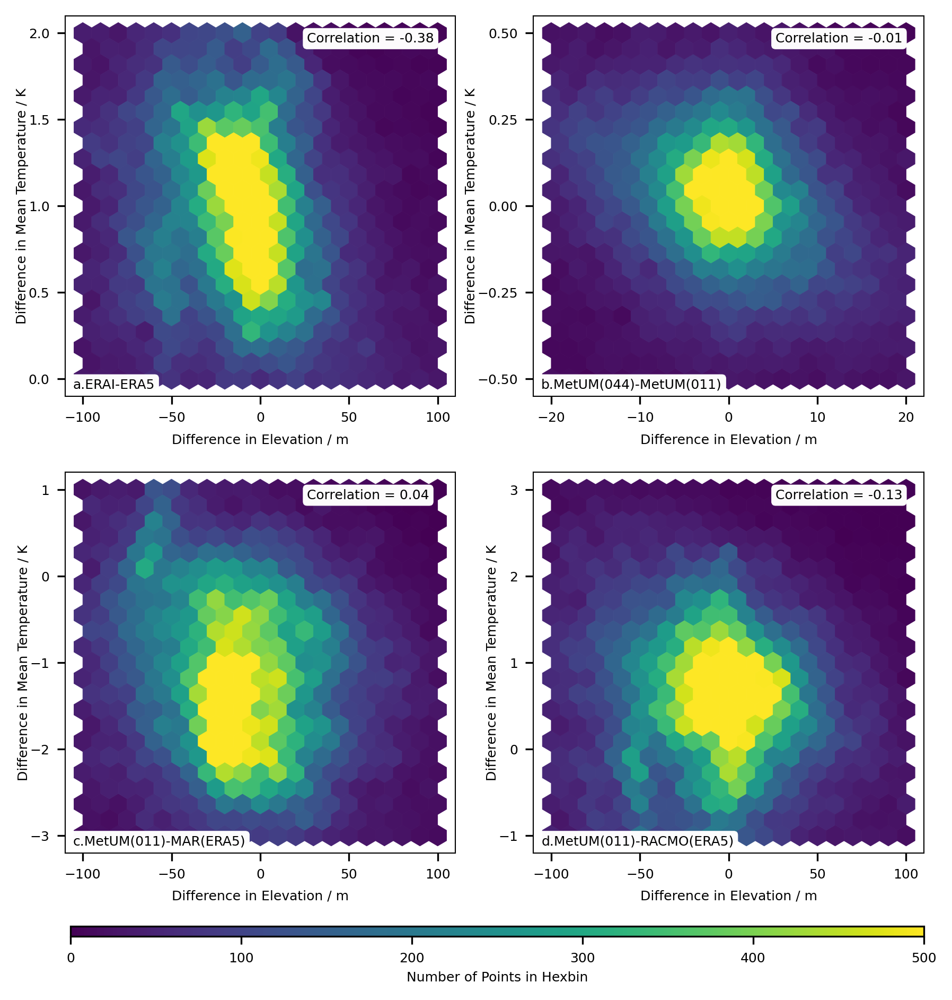

In [5]:
plt.rcParams.update({'font.size': 6})

variable = variables[1] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(2, 2, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,16.7*cm))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plots,correlations = [],[]
for model_pairs,plt_number,xlims,ylims in zip(model_pairs_list,plt_number_list,xlims_list,ylims_list):
    plot,correlation = correlation_bias_elevation_pair_plot(input_path,antarctica_map,xlims,ylims,variable,model_pairs,land_only_mask,mean_melt,subplot_dimensions,plt_number)
    plots.append(plot)
    correlations.append(correlation)
    
axes = plt.gcf().get_axes()

fig.subplots_adjust(bottom=0.08)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)
colorbar_label = "\n".join(wrap('Number of Points in Hexbin', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label,correlation in zip(plt.gcf().get_axes(),labels,correlations):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    bbox_props = dict(boxstyle="round", fc="w", ec="w",lw=0.2, alpha=0.99)
    axis.text(label_xy[0],label_xy[1],label,transform=axis.transAxes, size=6,bbox=bbox_props)
    axis.text(correlation_label_xy[0],correlation_label_xy[1],f'Correlation = {round(correlation,2)}',transform=axis.transAxes, fontsize=6,bbox=bbox_props)

plt.rcParams.update({'font.size': plt.rcParamsDefault['font.size']})
fig.savefig(f'{results_figures_path}Figure_C2.png',dpi=300,bbox_inches='tight')

## Figures D1,D2,D3

In [10]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
variables = ['snowfall','temperature','melt']
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')
grid_cube = iris.load(grid_cube_path)[0][0]

In [11]:
models = [1,3,5,7] #[0:ERAI,1:ERA5,2:MetUM(044),3:MetUM(011),4:MAR(ERAI),5:MAR(ERA5),6:RACMO(ERAI),7:RACMO(ERA5)]
vmin=-3
vmax=3
label_xy = [.01,.02]
title_height = 0.96
row_xy = [-0.05,0.5]
col_titles = ['Mean','Seasonal Standard Deviation','Residual Standard Deviation']
row_titles = ['ERAI-ERA5','MetUM(044)-MetUM(011)','MAR(ERAI)-MAR(ERA5)', 'RACMO(ERAI)-RACMO(ERA5)']
labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.','k.','l.']
subplot_dimensions = [4,3] # 4 rows, 3 columns of plots

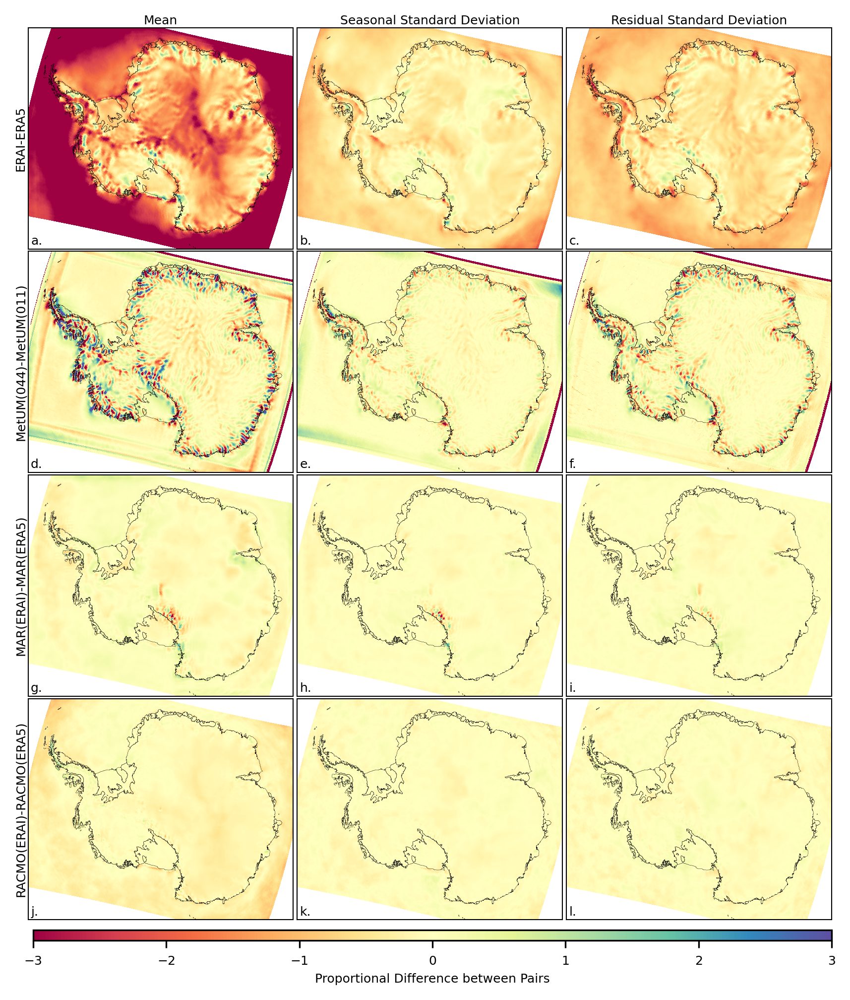

In [14]:
variable = variables[0] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

model_pairs = [0,1]
row_number=0
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [2,3]
row_number=1
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [4,5]
row_number=2
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [6,7]
row_number=3
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Proportional Difference between Pairs', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}Figure_D1.png',dpi=300,bbox_inches='tight')

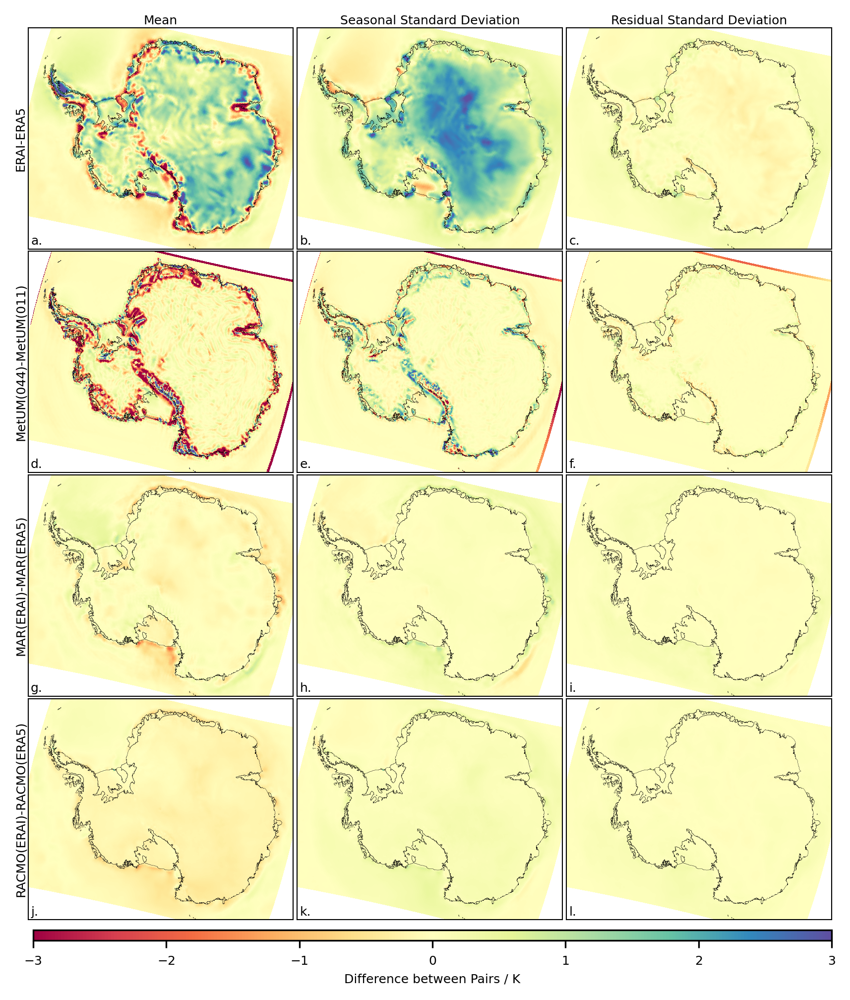

In [12]:
variable = variables[1] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

model_pairs = [0,1]
row_number=0
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [2,3]
row_number=1
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [4,5]
row_number=2
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [6,7]
row_number=3
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Difference between Pairs / K', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}Figure_D2.png',dpi=300,bbox_inches='tight')

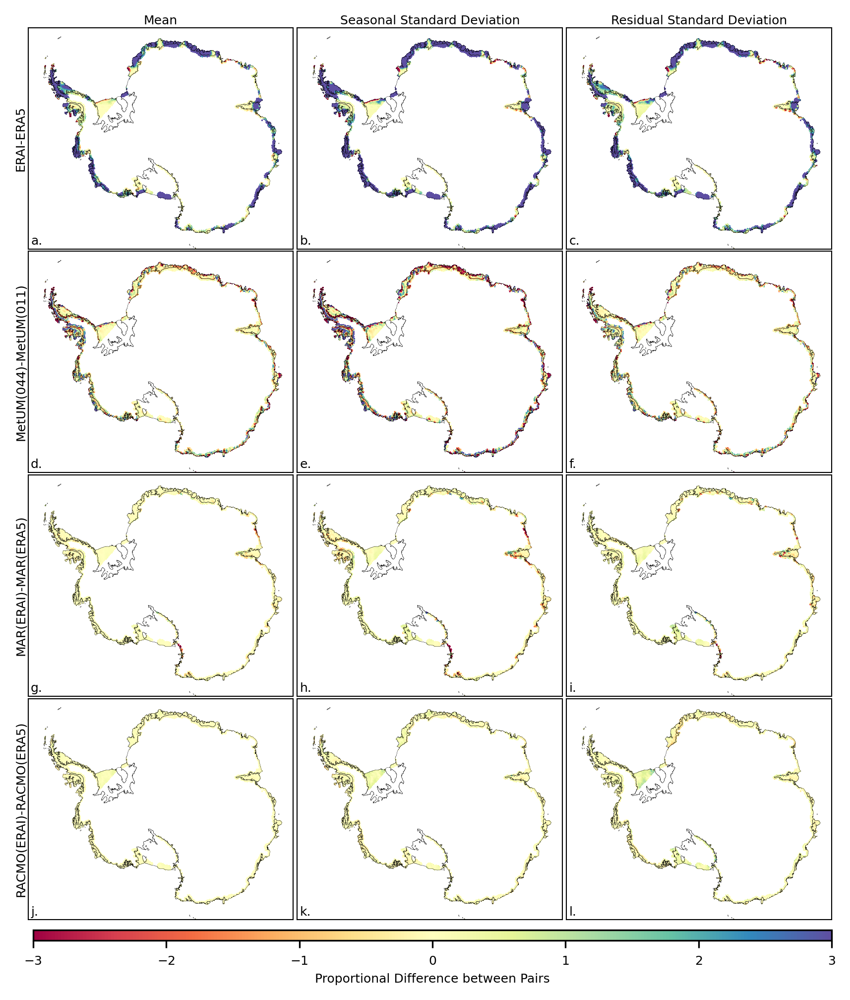

In [13]:
variable = variables[2] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

model_pairs = [0,1]
row_number=0
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [2,3]
row_number=1
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [4,5]
row_number=2
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [6,7]
row_number=3
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Proportional Difference between Pairs', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}Figure_D3.png',dpi=300,bbox_inches='tight')

# Tables

## Tables B1,B2,B3

In [3]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
variables = ['temperature','snowfall','melt']
components = [0,1,2] # 0=Trend component, 1=Seasonal component, 2=Residual component
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')

correlation_table(input_path,variables,components,land_only_mask,mean_melt)

Correlation:temperature,0


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.00,0.89,0.83,0.83,0.78,0.75,0.78,0.77
ERA5,0.89,1.00,0.85,0.85,0.84,0.86,0.86,0.87
MetUM(044),0.83,0.85,1.00,0.99,0.89,0.86,0.90,0.88
MetUM(011),0.83,0.85,0.99,1.00,0.89,0.86,0.90,0.88
MAR(ERAI),0.78,0.84,0.89,0.89,1.00,0.96,0.91,0.90
MAR(ERA5),0.75,0.86,0.86,0.86,0.96,1.00,0.88,0.92
RACMO(ERAI),0.78,0.86,0.90,0.90,0.91,0.88,1.00,0.95
RACMO(ERA5),0.77,0.87,0.88,0.88,0.90,0.92,0.95,1.00


Correlation:snowfall,0


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.00,0.92,0.94,0.91,0.85,0.83,0.88,0.88
ERA5,0.92,1.00,0.91,0.89,0.85,0.88,0.87,0.90
MetUM(044),0.94,0.91,1.00,0.97,0.86,0.84,0.88,0.87
MetUM(011),0.91,0.89,0.97,1.00,0.84,0.83,0.86,0.86
MAR(ERAI),0.85,0.85,0.86,0.84,1.00,0.95,0.83,0.82
MAR(ERA5),0.83,0.88,0.84,0.83,0.95,1.00,0.81,0.84
RACMO(ERAI),0.88,0.87,0.88,0.86,0.83,0.81,1.00,0.93
RACMO(ERA5),0.88,0.90,0.87,0.86,0.82,0.84,0.93,1.00


Correlation:melt,0


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.00,0.17,0.27,0.28,0.24,0.26,0.28,0.30
ERA5,0.17,1.00,0.28,0.29,0.21,0.22,0.27,0.27
MetUM(044),0.27,0.28,1.00,0.93,0.61,0.60,0.66,0.64
MetUM(011),0.28,0.29,0.93,1.00,0.64,0.62,0.68,0.66
MAR(ERAI),0.24,0.21,0.61,0.64,1.00,0.93,0.64,0.65
MAR(ERA5),0.26,0.22,0.60,0.62,0.93,1.00,0.65,0.67
RACMO(ERAI),0.28,0.27,0.66,0.68,0.64,0.65,1.00,0.89
RACMO(ERA5),0.30,0.27,0.64,0.66,0.65,0.67,0.89,1.00


Correlation:temperature,1


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
ERA5,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
MetUM(044),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
MetUM(011),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
MAR(ERAI),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
MAR(ERA5),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
RACMO(ERAI),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
RACMO(ERA5),1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


Correlation:snowfall,1


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.00,0.87,0.91,0.87,0.73,0.71,0.87,0.87
ERA5,0.87,1.00,0.87,0.85,0.81,0.82,0.89,0.91
MetUM(044),0.91,0.87,1.00,0.96,0.72,0.71,0.88,0.87
MetUM(011),0.87,0.85,0.96,1.00,0.71,0.69,0.87,0.86
MAR(ERAI),0.73,0.81,0.72,0.71,1.00,0.98,0.76,0.76
MAR(ERA5),0.71,0.82,0.71,0.69,0.98,1.00,0.74,0.77
RACMO(ERAI),0.87,0.89,0.88,0.87,0.76,0.74,1.00,0.95
RACMO(ERA5),0.87,0.91,0.87,0.86,0.76,0.77,0.95,1.00


Correlation:melt,1


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.00,0.36,0.69,0.69,0.65,0.66,0.64,0.65
ERA5,0.36,1.00,0.40,0.41,0.39,0.40,0.39,0.39
MetUM(044),0.69,0.40,1.00,0.95,0.86,0.86,0.86,0.86
MetUM(011),0.69,0.41,0.95,1.00,0.88,0.88,0.88,0.88
MAR(ERAI),0.65,0.39,0.86,0.88,1.00,0.98,0.86,0.86
MAR(ERA5),0.66,0.40,0.86,0.88,0.98,1.00,0.86,0.86
RACMO(ERAI),0.64,0.39,0.86,0.88,0.86,0.86,1.00,0.97
RACMO(ERA5),0.65,0.39,0.86,0.88,0.86,0.86,0.97,1.00


Correlation:temperature,2


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.00,0.96,0.96,0.96,0.93,0.92,0.92,0.92
ERA5,0.96,1.00,0.96,0.96,0.93,0.94,0.93,0.94
MetUM(044),0.96,0.96,1.00,0.99,0.94,0.93,0.93,0.93
MetUM(011),0.96,0.96,0.99,1.00,0.93,0.93,0.93,0.93
MAR(ERAI),0.93,0.93,0.94,0.93,1.00,0.99,0.92,0.92
MAR(ERA5),0.92,0.94,0.93,0.93,0.99,1.00,0.91,0.92
RACMO(ERAI),0.92,0.93,0.93,0.93,0.92,0.91,1.00,0.97
RACMO(ERA5),0.92,0.94,0.93,0.93,0.92,0.92,0.97,1.00


Correlation:snowfall,2


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.00,0.94,0.94,0.91,0.87,0.85,0.89,0.89
ERA5,0.94,1.00,0.93,0.91,0.87,0.88,0.89,0.91
MetUM(044),0.94,0.93,1.00,0.96,0.86,0.85,0.88,0.88
MetUM(011),0.91,0.91,0.96,1.00,0.85,0.83,0.87,0.86
MAR(ERAI),0.87,0.87,0.86,0.85,1.00,0.97,0.83,0.83
MAR(ERA5),0.85,0.88,0.85,0.83,0.97,1.00,0.82,0.83
RACMO(ERAI),0.89,0.89,0.88,0.87,0.83,0.82,1.00,0.94
RACMO(ERA5),0.89,0.91,0.88,0.86,0.83,0.83,0.94,1.00


Correlation:melt,2


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,1.00,0.14,0.32,0.33,0.30,0.31,0.34,0.35
ERA5,0.14,1.00,0.27,0.28,0.21,0.21,0.24,0.24
MetUM(044),0.32,0.27,1.00,0.92,0.56,0.55,0.61,0.60
MetUM(011),0.33,0.28,0.92,1.00,0.58,0.58,0.64,0.63
MAR(ERAI),0.30,0.21,0.56,0.58,1.00,0.92,0.61,0.61
MAR(ERA5),0.31,0.21,0.55,0.58,0.92,1.00,0.61,0.63
RACMO(ERAI),0.34,0.24,0.61,0.64,0.61,0.61,1.00,0.89
RACMO(ERA5),0.35,0.24,0.60,0.63,0.61,0.63,0.89,1.00


## Tables E1,E2,E3

In [4]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
variables = ['temperature','snowfall','melt']
components = [0,1,2] # 0=Trend component, 1=Seasonal component, 2=Residual component
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')

rmsd_table(input_path,variables,land_only_mask,mean_melt)

RMSE:Proportional RMSD,temperature


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,0.00,2.04,2.14,2.00,2.10,2.10,2.43,2.33
ERA5,2.04,0.00,2.52,2.28,2.28,2.22,1.97,1.81
MetUM(044),2.14,2.52,0.00,0.84,2.70,2.74,2.29,2.29
MetUM(011),2.00,2.28,0.84,0.00,2.43,2.46,2.18,2.17
MAR(ERAI),2.10,2.28,2.70,2.43,0.00,0.44,2.45,2.31
MAR(ERA5),2.10,2.22,2.74,2.46,0.44,0.00,2.49,2.29
RACMO(ERAI),2.43,1.97,2.29,2.18,2.45,2.49,0.00,0.81
RACMO(ERA5),2.33,1.81,2.29,2.17,2.31,2.29,0.81,0.00


RMSE:% Reduction Trend,temperature


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,25.5%,53.0%,51.4%,41.3%,40.0%,44.8%,42.3%
ERA5,25.5%,nan%,26.9%,24.3%,36.6%,37.7%,22.1%,22.3%
MetUM(044),53.0%,26.9%,nan%,48.7%,49.2%,48.6%,34.9%,34.1%
MetUM(011),51.4%,24.3%,48.7%,nan%,46.5%,45.9%,33.1%,32.1%
MAR(ERAI),41.3%,36.6%,49.2%,46.5%,nan%,19.5%,48.5%,46.2%
MAR(ERA5),40.0%,37.7%,48.6%,45.9%,19.5%,nan%,48.0%,47.2%
RACMO(ERAI),44.8%,22.1%,34.9%,33.1%,48.5%,48.0%,nan%,11.9%
RACMO(ERA5),42.3%,22.3%,34.1%,32.1%,46.2%,47.2%,11.9%,nan%


RMSE:% Reduction Trend and Season,temperature


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,61.2%,63.7%,61.0%,50.5%,49.5%,51.6%,50.2%
ERA5,61.2%,nan%,65.4%,62.3%,56.2%,56.9%,47.3%,46.0%
MetUM(044),63.7%,65.4%,nan%,68.3%,62.9%,62.4%,48.6%,49.5%
MetUM(011),61.0%,62.3%,68.3%,nan%,58.7%,58.2%,45.5%,46.0%
MAR(ERAI),50.5%,56.2%,62.9%,58.7%,nan%,20.6%,52.6%,50.2%
MAR(ERA5),49.5%,56.9%,62.4%,58.2%,20.6%,nan%,52.1%,51.3%
RACMO(ERAI),51.6%,47.3%,48.6%,45.5%,52.6%,52.1%,nan%,13.6%
RACMO(ERA5),50.2%,46.0%,49.5%,46.0%,50.2%,51.3%,13.6%,nan%


RMSE:% Reduction Trend, Season and Residual,temperature


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,61.6%,64.6%,62.3%,51.3%,50.4%,56.6%,54.9%
ERA5,61.6%,nan%,66.4%,63.4%,56.3%,57.1%,52.8%,51.3%
MetUM(044),64.6%,66.4%,nan%,69.8%,63.8%,63.2%,55.9%,56.1%
MetUM(011),62.3%,63.4%,69.8%,nan%,59.8%,59.2%,53.5%,53.3%
MAR(ERAI),51.3%,56.3%,63.8%,59.8%,nan%,18.9%,57.3%,54.5%
MAR(ERA5),50.4%,57.1%,63.2%,59.2%,18.9%,nan%,56.7%,55.7%
RACMO(ERAI),56.6%,52.8%,55.9%,53.5%,57.3%,56.7%,nan%,22.2%
RACMO(ERA5),54.9%,51.3%,56.1%,53.3%,54.5%,55.7%,22.2%,nan%


RMSE:Proportional RMSD,snowfall


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,0.00,1.88,1.86,2.25,3.58,3.66,2.58,2.66
ERA5,1.88,0.00,1.83,2.08,2.98,2.93,2.04,1.94
MetUM(044),1.86,1.83,0.00,1.23,3.31,3.41,2.32,2.40
MetUM(011),2.25,2.08,1.23,0.00,3.43,3.52,2.41,2.49
MAR(ERAI),3.58,2.98,3.31,3.43,0.00,1.01,3.19,3.19
MAR(ERA5),3.66,2.93,3.41,3.52,1.01,0.00,3.28,3.15
RACMO(ERAI),2.58,2.04,2.32,2.41,3.19,3.28,0.00,1.30
RACMO(ERA5),2.66,1.94,2.40,2.49,3.19,3.15,1.30,0.00


RMSE:% Reduction Trend,snowfall


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,28.6%,24.4%,25.2%,31.6%,31.3%,31.6%,33.1%
ERA5,28.6%,nan%,18.1%,18.3%,24.8%,25.3%,16.4%,19.1%
MetUM(044),24.4%,18.1%,nan%,23.3%,25.1%,24.6%,23.0%,23.9%
MetUM(011),25.2%,18.3%,23.3%,nan%,24.1%,23.7%,21.9%,22.8%
MAR(ERAI),31.6%,24.8%,25.1%,24.1%,nan%,9.8%,19.8%,19.6%
MAR(ERA5),31.3%,25.3%,24.6%,23.7%,9.8%,nan%,19.5%,19.8%
RACMO(ERAI),31.6%,16.4%,23.0%,21.9%,19.8%,19.5%,nan%,6.9%
RACMO(ERA5),33.1%,19.1%,23.9%,22.8%,19.6%,19.8%,6.9%,nan%


RMSE:% Reduction Trend and Season,snowfall


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,27.0%,25.6%,26.7%,36.6%,36.3%,31.2%,33.2%
ERA5,27.0%,nan%,18.8%,19.6%,30.3%,31.2%,16.3%,19.4%
MetUM(044),25.6%,18.8%,nan%,25.0%,31.2%,30.5%,23.5%,24.5%
MetUM(011),26.7%,19.6%,25.0%,nan%,30.3%,29.8%,22.5%,23.4%
MAR(ERAI),36.6%,30.3%,31.2%,30.3%,nan%,13.2%,25.3%,25.0%
MAR(ERA5),36.3%,31.2%,30.5%,29.8%,13.2%,nan%,24.9%,25.5%
RACMO(ERAI),31.2%,16.3%,23.5%,22.5%,25.3%,24.9%,nan%,5.7%
RACMO(ERA5),33.2%,19.4%,24.5%,23.4%,25.0%,25.5%,5.7%,nan%


RMSE:% Reduction Trend, Season and Residual,snowfall


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,29.9%,32.5%,33.9%,44.1%,42.9%,35.4%,37.3%
ERA5,29.9%,nan%,21.8%,24.2%,38.2%,39.0%,19.8%,23.4%
MetUM(044),32.5%,21.8%,nan%,33.8%,39.3%,38.1%,27.3%,28.1%
MetUM(011),33.9%,24.2%,33.8%,nan%,38.8%,37.7%,26.3%,27.2%
MAR(ERAI),44.1%,38.2%,39.3%,38.8%,nan%,20.4%,33.6%,33.3%
MAR(ERA5),42.9%,39.0%,38.1%,37.7%,20.4%,nan%,32.7%,33.6%
RACMO(ERAI),35.4%,19.8%,27.3%,26.3%,33.6%,32.7%,nan%,6.6%
RACMO(ERA5),37.3%,23.4%,28.1%,27.2%,33.3%,33.6%,6.6%,nan%


RMSE:Proportional RMSD,melt


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,0.00,8.40,9.15,9.54,10.24,10.28,9.09,9.00
ERA5,8.40,0.00,6.35,6.55,5.93,5.95,4.91,4.81
MetUM(044),9.15,6.35,0.00,2.75,5.90,6.01,4.84,4.86
MetUM(011),9.54,6.55,2.75,0.00,5.56,5.66,4.57,4.60
MAR(ERAI),10.24,5.93,5.90,5.56,0.00,1.54,4.58,4.53
MAR(ERA5),10.28,5.95,6.01,5.66,1.54,0.00,4.66,4.56
RACMO(ERAI),9.09,4.91,4.84,4.57,4.58,4.66,0.00,1.51
RACMO(ERA5),9.00,4.81,4.86,4.60,4.53,4.56,1.51,0.00


RMSE:% Reduction Trend,melt


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,10.4%,9.9%,10.1%,10.0%,10.0%,9.9%,9.9%
ERA5,10.4%,nan%,9.7%,9.8%,9.3%,9.3%,8.7%,8.5%
MetUM(044),9.9%,9.7%,nan%,10.5%,9.1%,9.1%,8.9%,8.8%
MetUM(011),10.1%,9.8%,10.5%,nan%,9.1%,9.1%,9.0%,8.9%
MAR(ERAI),10.0%,9.3%,9.1%,9.1%,nan%,6.9%,8.5%,8.5%
MAR(ERA5),10.0%,9.3%,9.1%,9.1%,6.9%,nan%,8.4%,8.4%
RACMO(ERAI),9.9%,8.7%,8.9%,9.0%,8.5%,8.4%,nan%,6.3%
RACMO(ERA5),9.9%,8.5%,8.8%,8.9%,8.5%,8.4%,6.3%,nan%


RMSE:% Reduction Trend and Season,melt


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,31.8%,42.9%,44.9%,44.4%,45.1%,40.5%,40.7%
ERA5,31.8%,nan%,20.8%,23.3%,10.6%,11.7%,-3.6%,-5.0%
MetUM(044),42.9%,20.8%,nan%,51.2%,35.8%,36.4%,31.2%,31.1%
MetUM(011),44.9%,23.3%,51.2%,nan%,34.6%,35.0%,31.0%,30.8%
MAR(ERAI),44.4%,10.6%,35.8%,34.6%,nan%,6.2%,23.1%,22.8%
MAR(ERA5),45.1%,11.7%,36.4%,35.0%,6.2%,nan%,23.7%,23.9%
RACMO(ERAI),40.5%,-3.6%,31.2%,31.0%,23.1%,23.7%,nan%,-4.5%
RACMO(ERA5),40.7%,-5.0%,31.1%,30.8%,22.8%,23.9%,-4.5%,nan%


RMSE:% Reduction Trend, Season and Residual,melt


,ERAI,ERA5,MetUM(044),MetUM(011),MAR(ERAI),MAR(ERA5),RACMO(ERAI),RACMO(ERA5)
ERAI,nan%,35.2%,56.2%,58.4%,58.5%,59.2%,53.9%,53.9%
ERA5,35.2%,nan%,18.7%,21.7%,10.0%,11.0%,-7.2%,-9.7%
MetUM(044),56.2%,18.7%,nan%,62.9%,49.2%,50.0%,41.2%,40.8%
MetUM(011),58.4%,21.7%,62.9%,nan%,48.4%,48.9%,40.8%,40.4%
MAR(ERAI),58.5%,10.0%,49.2%,48.4%,nan%,24.3%,36.3%,35.8%
MAR(ERA5),59.2%,11.0%,50.0%,48.9%,24.3%,nan%,37.1%,37.2%
RACMO(ERAI),53.9%,-7.2%,41.2%,40.8%,36.3%,37.1%,nan%,2.9%
RACMO(ERA5),53.9%,-9.7%,40.8%,40.4%,35.8%,37.2%,2.9%,nan%
